In [ ]:
import pandas as pd
import numpy as np
from random import *
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import files
files.upload()

Saving clean_kaggle_data_2022.csv to clean_kaggle_data_2022 (1).csv


{'clean_kaggle_data_2022 (1).csv': b'Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q6_10,Q6_11,Q6_12,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Q7_6,Q7_7,Q8,Q9,Q10_1,Q10_2,Q10_3,Q11,Q12_1,Q12_2,Q12_3,Q12_4,Q12_5,Q12_6,Q12_7,Q12_8,Q12_9,Q12_10,Q12_11,Q12_12,Q12_13,Q12_14,Q12_15,Q13_1,Q13_2,Q13_3,Q13_4,Q13_5,Q13_6,Q13_7,Q13_8,Q13_9,Q13_10,Q13_11,Q13_12,Q13_13,Q13_14,Q14_1,Q14_2,Q14_3,Q14_4,Q14_5,Q14_6,Q14_7,Q14_8,Q14_9,Q14_10,Q14_11,Q14_12,Q14_13,Q14_14,Q14_15,Q14_16,Q15_1,Q15_2,Q15_3,Q15_4,Q15_5,Q15_6,Q15_7,Q15_8,Q15_9,Q15_10,Q15_11,Q15_12,Q15_13,Q15_14,Q15_15,Q16,Q17_1,Q17_2,Q17_3,Q17_4,Q17_5,Q17_6,Q17_7,Q17_8,Q17_9,Q17_10,Q17_11,Q17_12,Q17_13,Q17_14,Q17_15,Q18_1,Q18_2,Q18_3,Q18_4,Q18_5,Q18_6,Q18_7,Q18_8,Q18_9,Q18_10,Q18_11,Q18_12,Q18_13,Q18_14,Q19_1,Q19_2,Q19_3,Q19_4,Q19_5,Q19_6,Q19_7,Q19_8,Q20_1,Q20_2,Q20_3,Q20_4,Q20_5,Q20_6,Q21_1,Q21_2,Q21_3,Q21_4,Q21_5,Q21_6,Q21_7,Q21_8,Q21_9,Q21_10,Q22,Q23,Q24,Q25,Q26,Q27,Q28_1,Q28_2,Q28_3,Q28_4,Q28_5,Q28_6,Q28_7,Q28_8,Q29,Q30,Q31_1

In [ ]:
salaries = pd.read_csv('clean_kaggle_data_2022.csv', encoding='ISO-8859-1')
salaries.shape

(8137, 298)

In [ ]:
salaries.head()

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"


# Question 1: Data Cleaning

- Drop the second row since it is about the question details
- Drop other information too if they are irrelevant to the task

In [ ]:
# justify before define function
# find number of No in Q5
no_count = salaries['Q5'].str.strip().value_counts().get('No', 0)
print(f"Number of 'No' responses in Q5: {no_count}") # All responses are No, remove this column.

Number of 'No' responses in Q5: 8136


In [ ]:
def CleanData(df):
    # Drop the first row (question details)
    df.drop(df.index[0], inplace=True)

    #TODO: Drop other information too here if they are irrelevant to the task

    # Drop Q5 column because all responses are No
    df.drop('Q5',axis=1,inplace=True)

    # Modify Q8 because there are meaningless characters
    df['Q8'] = df['Q8'].str.replace(r'EE', "'", regex=True)

    # Drop column Q29 since there is Q29_Encoded
    df.drop('Q29', axis=1, inplace=True)

    # Drop column Q29_buckets since there is Q29_Encoded
    df.drop('Q29_buckets', axis=1, inplace=True)

    # Drop irrelevant column "Duration (in seconds)"
    df.drop('Duration (in seconds)',axis=1,inplace=True)

    return df

salaries = CleanData(salaries)
salaries.shape

(8136, 294)

In [ ]:
# check Q8
print(salaries['Q8']) #all meaningless characters are replaced

1       Some college/university study without earning ...
2                                       Bachelor's degree
3                                         Doctoral degree
4                                         Doctoral degree
5                                         Master's degree
                              ...                        
8132                                      Master's degree
8133                                      Master's degree
8134                                    Bachelor's degree
8135                                      Master's degree
8136                                      Doctoral degree
Name: Q8, Length: 8136, dtype: object


###**Impute missing values (single column responses)**

1. Identify columns with single column responses

2. Address missing values in those columns

In [ ]:
# Check single columns one-by-one before define cleaning function
single_col_names = ['Q29_Encoded','Q2','Q3','Q4','Q8','Q9','Q11','Q16','Q22','Q23','Q24','Q25','Q26','Q27','Q30','Q32','Q43']#TODO: extract single column names and store them as a list
multi_col_names = [col for col in salaries.columns if col not in single_col_names]

print("Percentage of null values: ")
print(salaries[single_col_names].isnull().sum()*100/len(salaries))

# There are high percentages of NA in columns Q9, Q22, Q32, and Q43. The best choice is to remove the whole column.
# There is a very small percentage of NA in column Q30, so I can remove the rows containing NA.
# There is a small percentage of NA in column Q16. Because this asks about the years used machine learning methods and it's categorical, I can fill NA with the mode.
salaries["Q16"].value_counts().head() # the mode is "Under 1 year"

# Before using mode to fulfill NA in column Q16, check the distribution (this code is from tutorial material)
a = salaries['Q29_Encoded'].value_counts(normalize=True) # the distribution of Q29_Encoded

# All the rows where the Q16 is NaN
salaries_Q16_null = salaries[salaries['Q16'].isnull()]

# The distribution of Q29_Encoded where the Q16 is NaN
b = salaries_Q16_null['Q29_Encoded'].value_counts(normalize=True)

print (pd.DataFrame({'Alldata': a, 'NaN Q16':b})) # is there a difference?

# The difference is large, fulfilling NA with "Unknown" instead of mode

Percentage of null values: 
Q29_Encoded     0.000000
Q2              0.000000
Q3              0.000000
Q4              0.000000
Q8              0.000000
Q9             36.147984
Q11             0.000000
Q16             8.407080
Q22            80.162242
Q23             0.000000
Q24             0.000000
Q25             0.000000
Q26             0.000000
Q27             0.000000
Q30             0.614553
Q32            77.126352
Q43            45.759587
dtype: float64
              Alldata   NaN Q16
Q29_Encoded                    
0.0          0.375860  0.612573
1.0          0.097345  0.092105
2.0          0.075467  0.068713
3.0          0.057030  0.039474
4.0          0.051745  0.026316
5.0          0.044985  0.040936
6.0          0.039086  0.019006
7.0          0.035521  0.021930
8.0          0.027286  0.013158
9.0          0.024213  0.005848
10.0         0.049656  0.020468
11.0         0.033063  0.013158
12.0         0.042035  0.011696
13.0         0.028638  0.005848
14.0         0.01806

In [ ]:
def ImputingSingleColMissingValues(df):
    # Tips: Include Q29_Encoded (target) in the single_col_names
    # so that its row size stays same as other rows after data preprocessing
    single_col_names = ['Q29_Encoded','Q2','Q3','Q4','Q8','Q9','Q11','Q16','Q22','Q23','Q24','Q25','Q26','Q27','Q30','Q32','Q43']#TODO: extract single column names and store them as a list

    print("Percentage of null values: ")
    print(df[single_col_names].isnull().sum()*100/len(df))


    #TODO: address missing values in single column responses in df

    # Remove columns Q9, Q22, Q32, and Q43
    df.drop(['Q9', 'Q22', 'Q32', 'Q43'], axis=1, inplace=True)

    # Remove NA in column Q30
    df.dropna(subset=['Q30'], inplace=True)

    # Fill NA with the mode for column Q16
    df['Q16'].fillna('Unknown', inplace=True)

    # Recalculate the remaining single column names to reflect changes (this is from ChatGpt)
    updated_single_col_names = [col for col in single_col_names if col in df.columns]

    print("Percentage of null values (make sure they are all zeros): ")
    print(df[updated_single_col_names].isnull().sum()*100/len(df))
    assert df[updated_single_col_names].isnull().values.sum() == 0, \
        "There are still missing values remaining!"

    return df

salaries = ImputingSingleColMissingValues(salaries)

Percentage of null values: 
Q29_Encoded     0.000000
Q2              0.000000
Q3              0.000000
Q4              0.000000
Q8              0.000000
Q9             36.147984
Q11             0.000000
Q16             8.407080
Q22            80.162242
Q23             0.000000
Q24             0.000000
Q25             0.000000
Q26             0.000000
Q27             0.000000
Q30             0.614553
Q32            77.126352
Q43            45.759587
dtype: float64
Percentage of null values (make sure they are all zeros): 
Q29_Encoded    0.0
Q2             0.0
Q3             0.0
Q4             0.0
Q8             0.0
Q11            0.0
Q16            0.0
Q23            0.0
Q24            0.0
Q25            0.0
Q26            0.0
Q27            0.0
Q30            0.0
dtype: float64


###**Encode categorical features (sinlge column responses)**

In [ ]:
#TODO: Encode categorical features in the single column responses

# check columns
print("Q29_Encoded",salaries["Q29_Encoded"].nunique())
print("Q2",salaries["Q2"].nunique())
print("Q3",salaries["Q3"].nunique())
print("Q4",salaries["Q4"].nunique())
print("Q8",salaries["Q8"].nunique())
print("Q11",salaries["Q11"].nunique())
print("Q16",salaries["Q16"].nunique())
print("Q23",salaries["Q23"].nunique())
print("Q24",salaries["Q24"].nunique())
print("Q25",salaries["Q25"].nunique())
print("Q26",salaries["Q26"].nunique())
print("Q27",salaries["Q27"].nunique())
print("Q30",salaries["Q30"].nunique())

# Since there are 58 numbers of categorical values, try to reduce them by combining multiple into one (this code is from tutorial material)
country_counts = salaries.Q4.value_counts()
country_less_50 = country_counts.index[country_counts < 50] # List of countries that appear less than 50 times
country_less_50
# Mask the countries that appear less than 50 times in the data
value_mask = salaries.Q4.isin(country_less_50)
salaries.loc[value_mask,'Q4'] = "Other" # now the categorical values number reduced to 30

# Encode Q2 (because age is ordinal)
print("Before encoded Q2:",salaries['Q2'].unique())
salaries['Q2'] = salaries['Q2'].replace('55-59', 55)
salaries['Q2'] = salaries['Q2'].replace('30-34', 30)
salaries['Q2'] = salaries['Q2'].replace('70+', 70)
salaries['Q2'] = salaries['Q2'].replace('40-44', 40)
salaries['Q2'] = salaries['Q2'].replace('50-54', 50)
salaries['Q2'] = salaries['Q2'].replace('25-29', 25)
salaries['Q2'] = salaries['Q2'].replace('60-69', 60)
salaries['Q2'] = salaries['Q2'].replace('35-39', 35)
salaries['Q2'] = salaries['Q2'].replace('22-24', 22)
salaries['Q2'] = salaries['Q2'].replace('45-49', 45)
salaries['Q2'] = salaries['Q2'].replace('18-21', 18)
print("After encoded Q2:",salaries['Q2'].unique()) # now all categories are encoded

# Encode Q11 (because years is ordinal)
print("Before encoded Q11:",salaries['Q11'].unique())
salaries['Q11'] = salaries['Q11'].replace('10-20 years', 10)
salaries['Q11'] = salaries['Q11'].replace('20+ years', 20)
salaries['Q11'] = salaries['Q11'].replace('5-10 years', 5)
salaries['Q11'] = salaries['Q11'].replace('3-5 years', 3)
salaries['Q11'] = salaries['Q11'].replace('< 1 years', 0.5) # I use 0.5 instead of 0 because there is a huge difference between "never" and "have"
salaries['Q11'] = salaries['Q11'].replace('1-3 years', 1)
salaries['Q11'] = salaries['Q11'].replace('I have never written code', 0)
print("After encoded Q11:",salaries['Q11'].unique())

# Encode Q16 (because years is ordinal)
print("Before encoded Q16:",salaries['Q16'].unique())
salaries['Q16'] = salaries['Q16'].replace('1-2 years', 1)
salaries['Q16'] = salaries['Q16'].replace('4-5 years', 4)
salaries['Q16'] = salaries['Q16'].replace('5-10 years', 5)
salaries['Q16'] = salaries['Q16'].replace('2-3 years', 2)
salaries['Q16'] = salaries['Q16'].replace('Under 1 year', 0.5)
salaries['Q16'] = salaries['Q16'].replace('3-4 years', 3)
salaries['Q16'] = salaries['Q16'].replace('10-20 years', 10)
salaries['Q16'] = salaries['Q16'].replace('I do not use machine learning methods', 0)
salaries['Q16'] = salaries['Q16'].replace('Unknown', 0)
print("After encoded Q16:",salaries['Q16'].unique())

# Encode Q25 (because size is ordinal)
print("Before encoded Q25:",salaries['Q25'].unique())
salaries['Q25'] = salaries['Q25'].replace('0-49 employees', 20)
salaries['Q25'] = salaries['Q25'].replace('250-999 employees', 250)
salaries['Q25'] = salaries['Q25'].replace('1000-9,999 employees', 1000)
salaries['Q25'] = salaries['Q25'].replace('50-249 employees', 50)
salaries['Q25'] = salaries['Q25'].replace('10,000 or more employees', 20000)
print("After encoded Q25:",salaries['Q25'].unique())

# Encode Q26 (because number of people is ordinal)
print("Before encoded Q26:",salaries['Q26'].unique())
salaries['Q26'] = salaries['Q26'].replace('2-Jan', 1)
salaries['Q26'] = salaries['Q26'].replace('20+', 20)
salaries['Q26'] = salaries['Q26'].replace('4-Mar', 3)
salaries['Q26'] = salaries['Q26'].replace('9-May', 5)
salaries['Q26'] = salaries['Q26'].replace('0', 0)
salaries['Q26'] = salaries['Q26'].replace('14-Oct', 10)
salaries['Q26'] = salaries['Q26'].replace('15-19', 15)
print("After encoded Q26:",salaries['Q26'].unique())

# Encode Q30 (because money is ordinal)
print("Before encoded Q30:",salaries['Q30'].unique())
salaries['Q30'] = salaries['Q30'].replace('$1000-$9,999', 5000)
salaries['Q30'] = salaries['Q30'].replace('$0 ($USD)', 0)
salaries['Q30'] = salaries['Q30'].replace('$100-$999', 500)
salaries['Q30'] = salaries['Q30'].replace('$100,000 or more ($USD)', 100000)
salaries['Q30'] = salaries['Q30'].replace('$1-$99', 45)
salaries['Q30'] = salaries['Q30'].replace('$10,000-$99,999', 50000)

# Encode: Create dummy features for each categorical feature (this code from lecture material)
salaries = pd.get_dummies(data=salaries, columns=['Q3','Q4','Q8','Q23','Q24','Q27'], dtype=int) # use dtype=int to make True/False values to 1/0

Q29_Encoded 15
Q2 11
Q3 5
Q4 58
Q8 7
Q11 7
Q16 9
Q23 14
Q24 15
Q25 5
Q26 7
Q27 6
Q30 6
Before encoded Q2: ['55-59' '30-34' '70+' '40-44' '50-54' '25-29' '60-69' '35-39' '22-24'
 '45-49' '18-21']
After encoded Q2: [55 30 70 40 50 25 60 35 22 45 18]
Before encoded Q11: ['10-20 years' '20+ years' '5-10 years' '3-5 years' '< 1 years'
 '1-3 years' 'I have never written code']
After encoded Q11: [10.  20.   5.   3.   0.5  1.   0. ]
Before encoded Q16: ['1-2 years' '4-5 years' '5-10 years' '2-3 years' 'Under 1 year'
 '3-4 years' '10-20 years' 'I do not use machine learning methods'
 'Unknown']
After encoded Q16: [ 1.   4.   5.   2.   0.5  3.  10.   0. ]
Before encoded Q25: ['0-49 employees' '250-999 employees' '1000-9,999 employees'
 '50-249 employees' '10,000 or more employees']
After encoded Q25: [   20   250  1000    50 20000]
Before encoded Q26: ['2-Jan' '20+' '4-Mar' '9-May' '0' '14-Oct' '15-19']
After encoded Q26: [ 1 20  3  5  0 10 15]
Before encoded Q30: ['$1000-$9,999' '$0 ($USD)' '$

In [ ]:
# codes are from lecture material
# Drop one of each of the dummy variables because its value is implied
# by the other dummy variable columns
print("before dropping:",salaries.columns.tolist())
salaries = salaries.drop(['Q3_Prefer not to say','Q4_Argentina','Q8_I prefer not to answer','Q23_Other','Q24_Other','Q27_I do not know'],axis=1)
print("after dropping:",salaries.columns.tolist())

before dropping: ['Q2', 'Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_6', 'Q7_7', 'Q10_1', 'Q10_2', 'Q10_3', 'Q11', 'Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15', 'Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_13', 'Q13_14', 'Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16', 'Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15', 'Q16', 'Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_10', 'Q17_11', 'Q17_12', 'Q17_13', 'Q17_14', 'Q17_15', 'Q18_1', 'Q18_2', 'Q18_3', 'Q18_4', 'Q18_5', 'Q18_6', 'Q18_7', 'Q18_8', 'Q1

###**Handling categorical features (multi column responses)**

In [ ]:
print(multi_col_names)

['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_6', 'Q7_7', 'Q10_1', 'Q10_2', 'Q10_3', 'Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15', 'Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_13', 'Q13_14', 'Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16', 'Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15', 'Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_10', 'Q17_11', 'Q17_12', 'Q17_13', 'Q17_14', 'Q17_15', 'Q18_1', 'Q18_2', 'Q18_3', 'Q18_4', 'Q18_5', 'Q18_6', 'Q18_7', 'Q18_8', 'Q18_9', 'Q18_10', 'Q18_11', 'Q18_12', '

In [ ]:
#TODO: Address missing values in the multi-column responses and perform encoding for categorical features
# this code is from ChatGpt
for col in multi_col_names:
    salaries[col] = salaries[col].notna().astype(int)
print(salaries[multi_col_names].head())

   Q6_1  Q6_2  Q6_3  Q6_4  Q6_5  Q6_6  Q6_7  Q6_8  Q6_9  Q6_10  ...  Q44_3  \
1     1     0     1     0     0     0     1     0     0      0  ...      0   
2     1     1     0     0     0     1     1     0     0      0  ...      1   
3     1     0     1     0     0     0     0     0     0      0  ...      0   
4     1     0     1     0     1     1     1     0     0      0  ...      0   
5     1     0     0     0     0     1     1     0     1      0  ...      0   

   Q44_4  Q44_5  Q44_6  Q44_7  Q44_8  Q44_9  Q44_10  Q44_11  Q44_12  
1      1      1      0      0      1      0       0       0       0  
2      0      0      1      0      1      0       0       0       0  
3      0      0      0      1      0      0       0       0       0  
4      0      0      0      1      1      0       0       0       0  
5      0      0      0      1      1      1       0       0       0  

[5 rows x 277 columns]


###**Drop the target variable(s) and get the target variable**

In [ ]:
# Make sure there are no missing values remaining in the dataset
assert salaries.isnull().values.sum() == 0, \
    "There are still {} missing values remaining in salaries!".format(
        salaries.isnull().values.sum()
    )

In [ ]:
target = salaries[['Q29_Encoded']]
print(target)


#TODO: Drop the target variables from the feature set
salaries.drop(target,axis=1,inplace=True)

# Make sure the target variables are not included in the feature set
for col in salaries.columns:
    assert 'Q29' not in col, \
        "Target variable ({}) is still in the dataset".format(col)

      Q29_Encoded
1             2.0
2            10.0
3            10.0
4            13.0
5            13.0
...           ...
8132         10.0
8133          0.0
8134          0.0
8135          2.0
8136          1.0

[8086 rows x 1 columns]


# Question 2: Exploratory Feature Analysis

- From Question 2 - Question 4, you should **NOT** peek at the test labels in any form!
- Assume that you do not know the target values (Q29_Encoded) on the test set

## Split data into training and test sets

In [ ]:
print(target)

      Q29_Encoded
1             2.0
2            10.0
3            10.0
4            13.0
5            13.0
...           ...
8132         10.0
8133          0.0
8134          0.0
8135          2.0
8136          1.0

[8086 rows x 1 columns]


In [ ]:
# You can use from sklearn.model_selection.train_test_split() Can I change original code????????
#train_df, test_df, y_train, y_test = train_test_split(salaries,target, test_size=0.2, random_state=2024)#TODO
X_train, X_test, y_train, y_test = train_test_split(salaries,target, test_size=0.2, random_state=2024)#TODO

#X_train = train_df.values
#X_test = test_df.values
#y_train = y_train.values
#y_test = y_test.values

In [ ]:
# check number of train data and test data
print("X_train:",X_train.shape)
print("y_train:",y_train.shape)
print("X_test:",X_test.shape)
print("y_test:",y_test.shape)

X_train: (6468, 354)
y_train: (6468, 1)
X_test: (1618, 354)
y_test: (1618, 1)


## **Feature Engineering/Generation**

- Create new feature(s) using existing features!

In [ ]:
#TODO: Create new features (feature generation)
X_train['LanguageNumber'] = (
    X_train['Q12_1'] + X_train['Q12_2'] + X_train['Q12_3'] + X_train['Q12_4'] +
    X_train['Q12_5'] + X_train['Q12_6'] + X_train['Q12_7'] + X_train['Q12_8'] +
    X_train['Q12_9'] + X_train['Q12_10'] + X_train['Q12_11'] + X_train['Q12_12'] +
    X_train['Q12_13'] + X_train['Q12_14'] + X_train['Q12_15']
)#TODO

# new X_train and X_test
print("X_train:",X_train.shape)

X_train: (6468, 355)


## **Feature Selection**

- Select the features based on the criteria of your choice

In [ ]:
# Standardize the features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [ ]:
# First use decision tree to visualize the order of feature importance (this code is from lecture material) (Visualize??????????)
import operator # for sorting dictionaries
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=500)
tree.fit(X_train_scaled,y_train['Q29_Encoded'])

columns = salaries.columns.values
importance = tree.feature_importances_
c_imp = {}

# Populate dictionary
for col,imp in zip(columns,importance):
    c_imp[col] = imp

# Print in descending order
for col, imp in reversed(sorted(c_imp.items(), key=operator.itemgetter(1))):
    print (col,':',imp)

Q4_United States of America : 0.544527658350718
Q11 : 0.20213962914913783
Q4_India : 0.09538572702032151
Q16 : 0.09472382566261633
Q26 : 0.044180155967540866
Q2 : 0.019043003849665473
Q27_We use ML methods for generating insights (but do not put working models into production) : 0.0
Q27_We recently started using ML methods (i.e., models in production for less than 2 years) : 0.0
Q27_We have well established ML methods (i.e., models in production for more than 2 years) : 0.0
Q27_We are exploring ML methods (and may one day put a model into production) : 0.0
Q27_No (we do not use ML methods) : 0.0
Q24_Shipping/Transportation : 0.0
Q24_Retail/Sales : 0.0
Q24_Online Service/Internet-based Services : 0.0
Q24_Non-profit/Service : 0.0
Q24_Medical/Pharmaceutical : 0.0
Q24_Marketing/CRM : 0.0
Q24_Manufacturing/Fabrication : 0.0
Q24_Insurance/Risk Assessment : 0.0
Q24_Government/Public Service : 0.0
Q24_Energy/Mining : 0.0
Q24_Computers/Technology : 0.0
Q24_Broadcasting/Communications : 0.0
Q24_

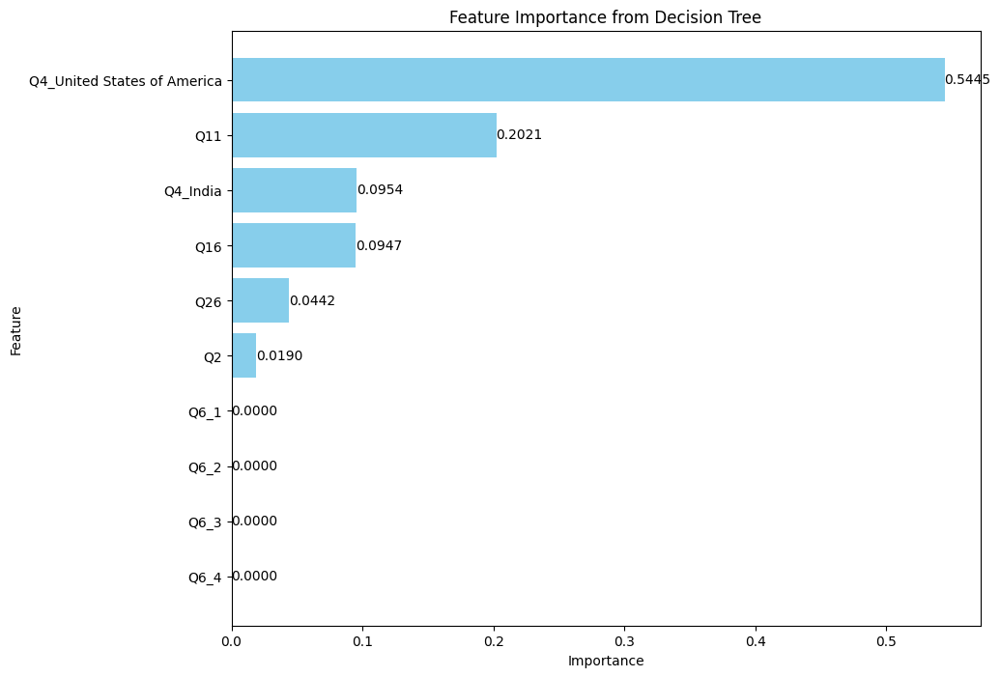

In [ ]:
# Get feature importances and associate with column names (ChatGpt)
c_imp = {col: imp for col, imp in zip(columns, importance)}

# Sort feature importances in descending order
sorted_c_imp = dict(sorted(c_imp.items(), key=operator.itemgetter(1), reverse=True)[:10])

# Convert to DataFrame for easier plotting
importance_df = pd.DataFrame(list(sorted_c_imp.items()), columns=['Feature', 'Importance'])

# Plot feature importances
plt.figure(figsize=(10, 8))
bars = plt.barh(importance_df['Feature'], importance_df['Importance'], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Decision Tree")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top

# Add importance numbers to each bar
for bar, importance in zip(bars, importance_df['Importance']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{importance:.4f}', va='center')

plt.show()

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso

# I use Lasso combined with RFE to select features
# Code are from ChatGpt

# Set up the Lasso model with increased alpha
lasso = Lasso(alpha=0.1, random_state=2024)

# Recursive feature elimination to select top features
selector = RFE(estimator=lasso, n_features_to_select=10)  # Set the desired number of final features
selector.fit(X_train_scaled, y_train)

# Get the selected features
selected_features = X_train.columns[selector.support_]

print("Selected Features:", selected_features)

Selected Features: Index(['Q11', 'Q16', 'Q26', 'Q30', 'Q4_Australia', 'Q4_India',
       'Q4_United Kingdom of Great Britain and Northern Ireland',
       'Q4_United States of America',
       'Q23_Manager (Program, Project, Operations, Executive-level, etc)',
       'Q24_Academics/Education'],
      dtype='object')


In [ ]:
selected_features = (['Q11', 'Q16', 'Q26', 'Q30', 'Q4_Australia', 'Q4_India',
       'Q4_United Kingdom of Great Britain and Northern Ireland',
       'Q4_United States of America',
       'Q23_Manager (Program, Project, Operations, Executive-level, etc)',
       'Q24_Academics/Education']) #TODO

In [ ]:
X_train_selected = X_train[selected_features]

## **Visualization**

- Make visualization to better understand your data

Text(0, 0.5, 'Number of Respondent')

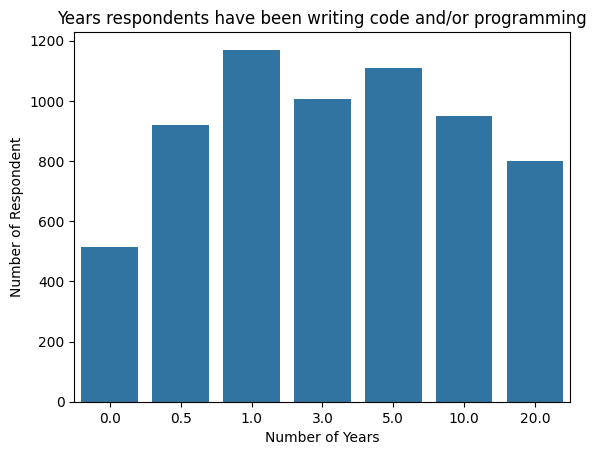

In [ ]:
X_train_selected_df = pd.DataFrame(X_train_selected)

sns.countplot(x='Q11',data=X_train_selected_df)
plt.title("Years respondents have been writing code and/or programming")
plt.xlabel("Number of Years")
plt.ylabel("Number of Respondent")

Text(0, 0.5, 'Number of Respondent')

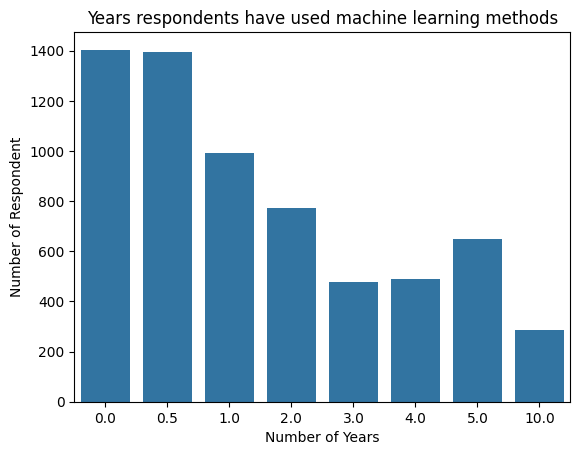

In [ ]:
sns.countplot(x='Q16',data=X_train_selected_df)
plt.title("Years respondents have used machine learning methods")
plt.xlabel("Number of Years")
plt.ylabel("Number of Respondent")

Text(0, 0.5, 'Number of Respondent')

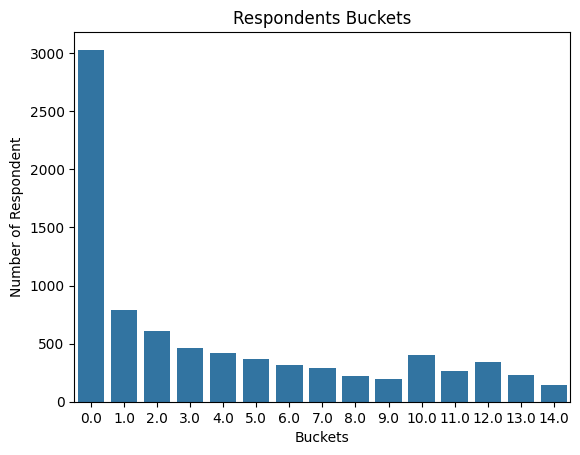

In [ ]:
sns.countplot(x='Q29_Encoded',data=target)
plt.title("Respondents Buckets")
plt.xlabel("Buckets")
plt.ylabel("Number of Respondent")

## **Apply the same feature engineering/selection to test data**

In [ ]:
#TODO: Feature generation code you applied to the training data
X_test['LanguageNumber'] = (
    X_test['Q12_1'] + X_test['Q12_2'] + X_test['Q12_3'] + X_test['Q12_4'] +
    X_test['Q12_5'] + X_test['Q12_6'] + X_test['Q12_7'] + X_test['Q12_8'] +
    X_test['Q12_9'] + X_test['Q12_10'] + X_test['Q12_11'] + X_test['Q12_12'] +
    X_test['Q12_13'] + X_test['Q12_14'] + X_test['Q12_15']
)

print("X_test:",X_test.shape)

# Leave selected features
X_test_selected = X_test[selected_features]

X_test: (1618, 355)


In [ ]:
# Standardize the selected features
scaler = StandardScaler()
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.transform(X_test_selected)

In [ ]:
X_train = X_train_selected_scaled
X_test = X_test_selected_scaled
y_train = y_train.values
y_test = y_test.values

# Question 3: Model Implementation

## Implement Ordinal Logistic Regression Model

In [ ]:
from sklearn.linear_model import LogisticRegression

class OrdinalLogisticRegression():
    # TODO: Add ordinal logreg hyperparameters as args to __init__
    # A dummy hyperparameter is put as a placeholder for now
    def __init__(self, max_iter=100, C=0.01, solver='lbfgs'):
        self.C = C
        self.max_iter = max_iter
        self.solver = solver

        self.classes_ = []
        self.models_ = []

    def fit(self, X, y):
        self.classes_ = sorted(np.unique(y))
        self.models_ = []

        # Train k-1 binary logistic regression models
        for i, c in enumerate(self.classes_[:-1]): # We need only k-1 classifiers
            y_i = np.where(y <= c, 0, 1)# TODO: label is 0 if the salary bucket is 0 to c, otherwise label is 1
            model = LogisticRegression(max_iter=self.max_iter, C=self.C)# TODO: what machine learning model should be here?
            model.fit(X, y_i)
            self.models_.append(model)

        return self

    def predict_proba(self, X):
        assert len(self.models_) > 0, "Model is not fitted yet. Run .fit() first."

        # Predicted probabilities for k-1 binary logistic regression models (initialize placeholders)
        binary_probabilities = np.empty((X.shape[0], len(self.models_), 2), dtype=float)

        # Make predictions of k-1 binary logistic regression models
        for i, model in enumerate(self.models_):
            binary_probabilities[:, i] = model.predict_proba(X)#TODO: predicted **probabilities** by the ith binary logistic regression model

        # Compute the probabilities to be in each class
        k = len(self.classes_)
        proba = np.empty((X.shape[0], k), dtype=float) # predicted probabilities for all the data in X (shape=(X.shape[0], k))

        proba[:, 0] = binary_probabilities[:, 0, 0] # 0th probability

        for i in range(1, k-1):
            # ith probability
            # (prob of belonging to class 0 for the ith model - prob of belonging to class 0 for the (i-1)th model
            proba[:, i] = binary_probabilities[:, i, 0] - binary_probabilities[:, i-1, 0]

        proba[:, -1] = binary_probabilities[:, k-2, 1] # (k-1)th probability

        assert (proba.sum(axis=1) == 1).all(), \
            'There is a problem in the probability computation'
        return proba

    def predict(self, X):
        proba = self.predict_proba(X)
        return np.argmax(proba, axis = 1)

    # Add hyperparameters here whenever you add new ones
    # max_iter is added as an example here. key is the hyperparameter name,
    # and value is the attribute name you defined in this class
    def get_params(self, deep=True):
        return {'max_iter': self.max_iter, 'C':self.C}

    # DO NOT CHANGE
    def set_params(self, **parameters):
        # Set estimator parameters
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

## Run k-fold cross validation

- Report the average/variance of accuracies across folds

In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

# codes are according to ChatGpt
# Set up k-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=2024)  # 10 folds
accuracies = []
fold_number = 0

# Loop through each fold
for train_index, test_index in kf.split(X_train):
    # Split the data into training and testing sets for each fold
    X_train_fold, X_test_fold = X_train[train_index], X_train[test_index]
    y_train_fold, y_test_fold = y_train[train_index], y_train[test_index]

    # Initialize and fit the model (use the appropriate model here, e.g., Logistic Regression)
    model = OrdinalLogisticRegression()  # Replace with the actual model and parameters
    model.fit(X_train_fold, y_train_fold)

    # Predict and calculate accuracy for this fold
    y_pred_fold = model.predict(X_test_fold)
    acc = accuracy_score(y_test_fold, y_pred_fold)
    accuracies.append(acc)
    fold_number += 1
    print("fold", fold_number, ":", acc)

# Calculate and display average accuracy and variance
print("Average accuracy    : ", np.mean(accuracies))
print("Variance of accuracy: ", np.var(accuracies))

fold 1 : 0.3956723338485317
fold 2 : 0.41112828438948995
fold 3 : 0.39258114374034003
fold 4 : 0.41731066460587324
fold 5 : 0.43585780525502316
fold 6 : 0.36476043276661513
fold 7 : 0.3616692426584235
fold 8 : 0.44049459041731065
fold 9 : 0.43034055727554177
fold 10 : 0.4241486068111455
Average accuracy    :  0.40739636617682945
Variance of accuracy:  0.0007090576353510714


## Bias-variance trade-off

[bias_variance_decomp.py](https://github.com/rasbt/mlxtend/blob/master/mlxtend/evaluate/bias_variance_decomp.py)

Below is a function you can use to compute the bias and variance of your ordinal logistic regression model. Using this function, analyze the ordinal logistic regression model performance based on bias-variance trade-off.

In [ ]:
### NOTE: You don't need to change anything in this code block! ###

def _draw_bootstrap_sample(rng, X, y):
    sample_indices = np.arange(X.shape[0])
    bootstrap_indices = rng.choice(
        sample_indices, size=sample_indices.shape[0], replace=True
    )
    return X[bootstrap_indices], y[bootstrap_indices]

def bias_variance_decomp(
    estimator,
    X_train,
    y_train,
    X_test,
    y_test,
    num_rounds=10,
    random_seed=0
):
    """
    estimator : object
        A classifier or regressor object or class implementing both a
        `fit` and `predict` method similar to the scikit-learn API.

    X_train : array-like, shape=(num_examples, num_features)
        A training dataset for drawing the bootstrap samples to carry
        out the bias-variance decomposition.

    y_train : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_train` examples.

    X_test : array-like, shape=(num_examples, num_features)
        The test dataset for computing the average loss, bias,
        and variance.

    y_test : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_test` examples.

    num_rounds : int (default=10)
        Number of bootstrap rounds (sampling from the training set)
        for performing the bias-variance decomposition. Each bootstrap
        sample has the same size as the original training set.

    random_seed : int (default=0)
        Random seed for the bootstrap sampling used for the
        bias-variance decomposition.

    Returns
    ----------
    avg_bias, avg_var : returns the average bias, and average bias (all floats),
                        where the average is computed over the data points
                        in the test set.

    """
    loss = "mse"

    for ary in (X_train, y_train, X_test, y_test):
        assert type(ary) == np.ndarray, \
            "X_train, y_train, X_test, y_test have to be NumPy array. \
            If e.g., X_train is a pandas DataFrame, convert it to NumPy array \
            via X_train=X_train.values."

    rng = np.random.RandomState(random_seed)

    # All the predictions across different rounds
    all_pred = np.zeros((num_rounds, y_test.shape[0]), dtype=np.float64)

    for i in range(num_rounds):
        # Randomly sample training data
        X_boot, y_boot = _draw_bootstrap_sample(rng, X_train, y_train)

        # Fit the model using the randomly sampled data
        pred = estimator.fit(X_boot, y_boot).predict(X_test)
        all_pred[i] = pred

    # Mean prediction across runs using different dataset for each data point
    main_predictions = np.mean(all_pred, axis=0)

    # Average bias across different rounds
    avg_bias = np.sum((main_predictions - y_test) ** 2) / y_test.size

    # Average variance across different rounds
    avg_var = np.sum((main_predictions - all_pred) ** 2) / all_pred.size

    return avg_bias, avg_var

In [ ]:
# Usage example
model = OrdinalLogisticRegression()
avg_bias, avg_var = \
    bias_variance_decomp(model, X_train, y_train, X_test, y_test, num_rounds=10, random_seed=0)

In [ ]:
print(avg_bias, avg_var)

62692.61414091476 0.5434116192830656


In [ ]:
# Define values of C to analyze
C_values = [0.01, 0.1, 1, 10, 100]
results = {}

for C in C_values:
    # Initialize model with the current C value
    model = OrdinalLogisticRegression(max_iter=100, C=C)

    # Perform bias-variance decomposition
    avg_bias, avg_var = bias_variance_decomp(
        model, X_train, y_train, X_test, y_test, num_rounds=10, random_seed=0
    )

    # Store the results
    results[C] = {
        'avg_bias': avg_bias,
        'avg_var': avg_var,
        'bias_variance_tradeoff': avg_bias + avg_var
    }

# Display results
print("Bias-Variance Trade-off Analysis:")
for C, metrics in results.items():
    print(f"C={C}: Avg Bias={metrics['avg_bias']:.4f}, Avg Variance={metrics['avg_var']:.4f}")

# Find the optimal C value with the lowest total error
best_C = min(results, key=lambda x: results[x]['bias_variance_tradeoff'])
print(f"\nBest C value in terms of bias-variance trade-off: {best_C}")

Bias-Variance Trade-off Analysis:
C=0.01: Avg Bias=62692.6141, Avg Variance=0.5434
C=0.1: Avg Bias=63445.9591, Avg Variance=0.6928
C=1: Avg Bias=63536.0338, Avg Variance=0.7121
C=10: Avg Bias=63547.7888, Avg Variance=0.7179
C=100: Avg Bias=63556.2853, Avg Variance=0.7135

Best C value in terms of bias-variance trade-off: 0.01


In [ ]:
#TODO: Discuss bias-variance trade-off of your ordinal logistic regression model

# Question 4: Model Tuning

- What are the hyperparameters we can potentially set for our ordinal logistic regression model?
- Which hyperparameters seem to be worthwhile to tune?

## why accuracy cannot be a suitable performance metric?

- In ordinal class features like Q29_buckets, accuracy doesn't work well.
- This is because the dataset is not balanced, which means for a categorical feature, one class appears more frequently than others.


## Grid Search

- Grid search will take time to complete - but if it does not finish in a few hours, you're probably trying too many combinations
- A recommended approach is to try a small number of combinations with a wide range first (for continuous value hyperparameters)! Then gradually increase the points that seem to be near optimal

## Identify all the hyperparameters that the ordinal logistic regression model can have

- penalty: Specifies the type of regularization. Options include l2 (default), l1, elasticnet, and none.
- C: Regularization strength (inverse of regularization parameter). A smaller C value implies stronger regularization.
- solver: Optimization algorithm used to fit the model. Options include lbfgs, liblinear, sag, saga, and newton-cg.
- max_iter: Maximum number of iterations for the solver to converge.
- fit_intercept: Whether or not to include an intercept term in the model.
- class_weight: Weights associated with classes to handle imbalanced datasets. Options include balanced or custom weights.

In [ ]:
from sklearn.model_selection import GridSearchCV


#TODO: Perform grid search using a proper criteria and identify the best parameter set

from sklearn.metrics import make_scorer, f1_score, accuracy_score, precision_score, recall_score, confusion_matrix
import numpy as np

# Define the parameter grid
param_grid = {
    'C': [0.001,0.01,0.05,0.1,0.5,1,5,10, 100],  # Regularization strength
    'solver': ['lbfgs', 'liblinear', 'sag', 'saga']  # Different solvers
}

# Initialize the model
model = OrdinalLogisticRegression(max_iter=100)

# Use F1-score as the scoring metric (or other selected metrics from question 4.1)
scorer = make_scorer(f1_score, average='weighted')

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(model, param_grid, scoring=scorer, cv=5)

# Fit the grid search
grid_search.fit(X_train, y_train)

# Output the best hyperparameters and best score
print("Best hyperparameters:", grid_search.best_params_)
print("Best F1-score:", grid_search.best_score_)

Best hyperparameters: {'C': 10, 'solver': 'lbfgs'}
Best F1-score: 0.29433124024566765


## Visualize the feature importance of your model

In [ ]:
model = OrdinalLogisticRegression(C=10, solver='lbfgs') #TODO: set the best-performing hyperparameters identified via grid search
model = model.fit(X_train, y_train)

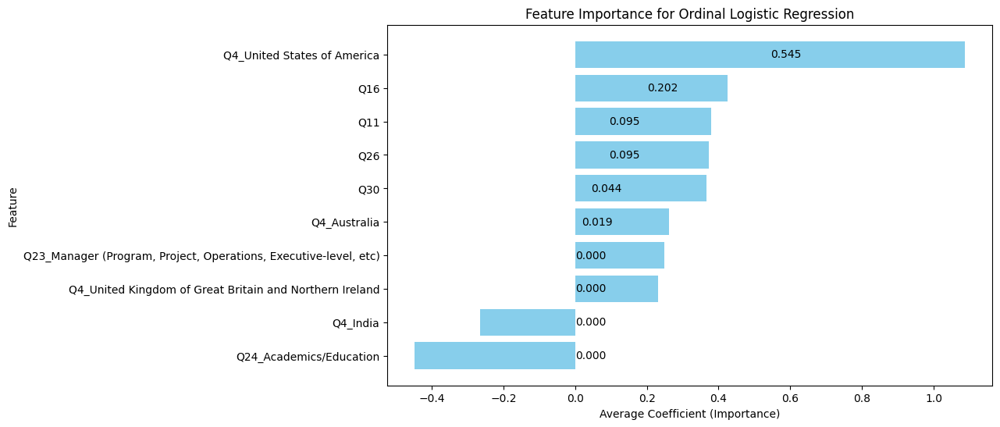

In [ ]:
#TODO: Visualize feature importance of the ordinal logistic regression model

# Code are from ChatGpt
# Collect feature importances (average of coefficients from each binary classifier)
coefficients = np.mean([m.coef_[0] for m in model.models_], axis=0)

# Get feature names (if X_train is a DataFrame)
X_train = pd.DataFrame(X_train, columns=X_train_selected.columns)
feature_names = X_train.columns  # Use column names directly from X_train

# Create a DataFrame for visualization
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': coefficients})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color="skyblue")
plt.xlabel("Average Coefficient (Importance)")
plt.ylabel("Feature")
plt.title("Feature Importance for Ordinal Logistic Regression")
plt.gca().invert_yaxis()  # Highest importance at the top

# Add labels on each bar
for bar in bars:
    plt.text(
        bar.get_width(),
        bar.get_y() + bar.get_height() / 2,
        f'{bar.get_width():.3f}',
        va='center'
    )

plt.show()

# Question 5: Testing

In [ ]:
#TODO: Using the best-performing model, evaluate the model performance both on the training set and test set
# Codes are partialy from ChatGpt

# training set
y_train_pred = model.predict(X_train)

# test set
y_test_pred = model.predict(X_test)

# Training set metrics
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted')
train_recall = recall_score(y_train, y_train_pred, average='weighted')
train_f1 = f1_score(y_train, y_train_pred, average='weighted')

# Test set metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average='weighted')
test_recall = recall_score(y_test, y_test_pred, average='weighted')
test_f1 = f1_score(y_test, y_test_pred, average='weighted')

# Display results
print("Training Set Performance:")
print(f"Accuracy: {train_accuracy:.4f}")
print(f"Precision: {train_precision:.4f}")
print(f"Recall: {train_recall:.4f}")
print(f"F1 Score: {train_f1:.4f}")

print("\nTest Set Performance:")
print(f"Accuracy: {test_accuracy:.4f}")
print(f"Precision: {test_precision:.4f}")
print(f"Recall: {test_recall:.4f}")
print(f"F1 Score: {test_f1:.4f}")


Training Set Performance:
Accuracy: 0.4156
Precision: 0.2883
Recall: 0.4156
F1 Score: 0.2975

Test Set Performance:
Accuracy: 0.3999
Precision: 0.2449
Recall: 0.3999
F1 Score: 0.2790


In [ ]:
#TODO: Plot the distribution of true target variable values and their predictions on both the training set and test set

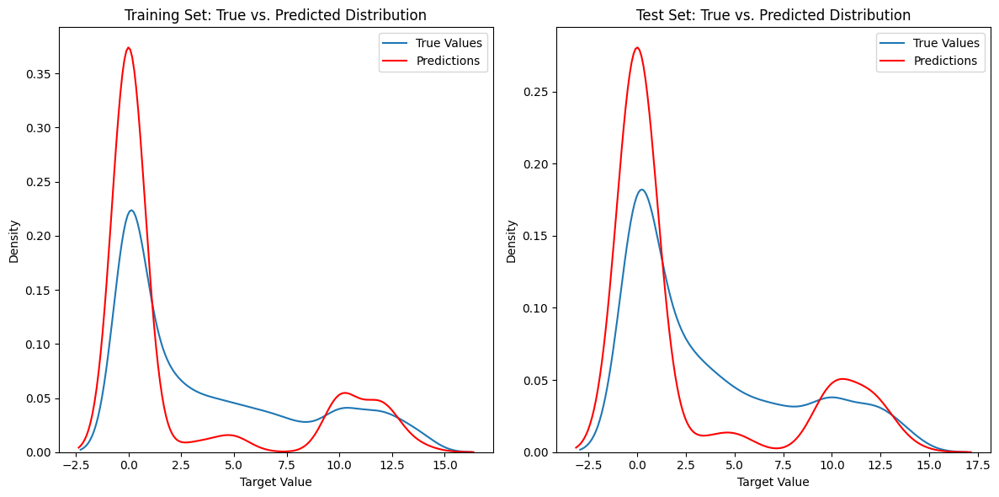

In [ ]:
# Code from ChatGpt
# Plot distribution for the training set
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(y_train, label="True Values", color="blue", fill=False)
sns.kdeplot(y_train_pred, label="Predictions", color="red", fill=False)
plt.title("Training Set: True vs. Predicted Distribution")
plt.xlabel("Target Value")
plt.legend()

# Plot distribution for the test set
plt.subplot(1, 2, 2)
sns.kdeplot(y_test, label="True Values", color="blue", fill=False)
sns.kdeplot(y_test_pred, label="Predictions", color="red", fill=False)
plt.title("Test Set: True vs. Predicted Distribution")
plt.xlabel("Target Value")
plt.legend()

plt.tight_layout()
plt.show()